# Music Genres Clustering Walkthrough

In today's world, data is being generated at an unprecedented rate, and businesses are constantly seeking new ways to extract valuable insights from it. Clustering is a powerful technique that allows us to group similar data points together, uncovering patterns and relationships that may not be immediately apparent.

In this project, I will be exploring music genres, clustering by their characteristics and applying it to a real-world dataset. Through a series of data exploration, preprocessing, and modeling steps, I will demonstrate how clustering can help us gain a deeper understanding of our data and ultimately make more informed decisions. The project will involve several phases, including data collection, cleaning, and preprocessing, exploratory data analysis, model building, and evaluation. I will use various tools and technologies, such as Python, SQL, and visualization libraries to facilitate this process, this phases will be introducted as Machine Learning workflow and goals.

Overall, the purpose of this notebook is to guide through a typical checklist for an end-to-end data science project and demonstrate my thought process while solving a problem, in this case I am going to be working with a real life problem from Amazon Music.

My goal with this project it's to implement a prediction model and solve the problem the most efficient way posible, taking into account the cost of deployment and score of the trained model. For this, I am not looking for a perfect score but rather looking a sustainable model and cost efficient for the company.

-----
# Machine Learning Workflow

If you are following my projects you already know that I like to implement a workflow to keep everything organized, having a simple approach and dividing each step into phases. With this I can have a clear goal to approach and reach.

As usual, in my particular case the Machine Learning Workflow will have 7 sections:

1. Question or problem definition.

2. Acquire training and testing data.

3. Wrangle, prepare, cleanse the data.

4. Analyze, identify patterns, and explore the data.

5. Model, predict and solve the problem.

6. Visualize, report, and present the problem solving steps and final solution.

7. Supply or submit the results.

It is important to say that having a clear mindset through the entire notebook may implied combining multiple workflow stages, perform a stage earlier than indicated or perfom a stage multiple times in our workflow.

This would not change the main goal of the project or the approach we are trying to implement.

---
# Workflow goals

As a data scientist I will use every tool available to provide a solution for seven major goals in my workflow:

**1. Classifying:** I may want to classify or categorize our samples. I may also want to understand the implications or correlation of different classes with our solution goal.

**2. Correlating:** The problem need to be solved based on available features within the training dataset, so it is importan to ask: Which features within the dataset contribute significantly to our solution goal? Statistically speaking is there a correlation among a feature and solution goal? As the feature values change does the solution state change as well, and visa-versa? This can be tested both for numerical and categorical features in the given dataset.

**3. Converting:** Depending on the choice of model algorithm I may require all features to be converted to numerical equivalent values. So for instance converting text categorical values to numeric values.

**4. Complementing:** Data preparation may also require me to estimate any missing values within a feature. Model algorithms may work best when there are no missing values.

**5. Correcting:** I may also analyze the given training dataset for errors or possibly innacurate values within features and try to corrent these values or exclude the samples containing the errors (Outliers).

**6. Creating:** I could create new features based on an existing feature or a set of features if I need to, such that the new feature follows the correlation, conversion and completeness goals.

**7. Charting:** Select the right visualization plots and charts depending on nature of the data and the solutions goals.

-----
# Question or problem definition
## Problem description

Every person has a different taste in music. We cannot identify what kind of music does a person likes by just knowing about their lifestyle, hobbies, or profession. So it is difficult for music streaming applications to recommend music to a person. But if we know what kind of songs a person listens to daily, we can find similarities in all the music files and recommend similar music to the person.

That is where the cluster analysis of music genres comes in. Here we have a dataset of popular songs on Amazon Music, which contains artists and music names with all audio characteristics of each music. 

## Project objective

The goal of the project is to group music genres based on similarities in their audio characteristics.

# Acquire training and testing data

## Load libraries

In [1]:
# Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Settings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
init_notebook_mode(connected=True)
sns.set_style('whitegrid')
%matplotlib inline

## Load project data

In [2]:
data = pd.read_csv('Data/AM-Sample-2000.csv', index_col = 'Index')

# Wrangle, prepare, cleanse the data

## Understanding the data information

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 1 to 1994
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Title                   1994 non-null   object
 1   Artist                  1994 non-null   object
 2   Top Genre               1994 non-null   object
 3   Year                    1994 non-null   int64 
 4   Beats Per Minute (BPM)  1994 non-null   int64 
 5   Energy                  1994 non-null   int64 
 6   Danceability            1994 non-null   int64 
 7   Loudness (dB)           1994 non-null   int64 
 8   Liveness                1994 non-null   int64 
 9   Valence                 1994 non-null   int64 
 10  Length (Duration)       1994 non-null   object
 11  Acousticness            1994 non-null   int64 
 12  Speechiness             1994 non-null   int64 
 13  Popularity              1994 non-null   int64 
dtypes: int64(10), object(4)
memory usage: 233.7+ KB


## Understanding the data

**Index:** Id of each entry

**Title::** Title of the song

**Artist:** Name of the artist

**Top Genre:** Classified Genre

**Year:** Release year

**Beats Per Minute (BPM):** It indicates the number of beats in one minute

**Energy:** Sound vibrations

**Danceability:** Danceability of the song in a range 

**Loudness (dB):** Loudness settings of the song

**Liveness:** A range telling the liveness of the song

**Valence:** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track.

**Length (Duration):** Duration of the song

**Acouticness:** The condition of being acoustic.

**Speechiness:** Presence of spoken words in the song.

**Popularity:** Popularity of the song.

## Understanding the data structure

In [4]:
data.head()

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
Index,,,,,,,,,,,,,,
1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59


# Analyze, identify patterns, and explore the data.

Lets do some basic EAD to understand the data correlations and trends.

## Top Genre

Top Genre is not the actual target, but the objective is to cluster very similar genres of music for a recomendation system, so it can really helps us to understand how many cluster we might have and guide it trough the elbow method. Lets take a look at the variable.

In [5]:
data['Top Genre'].nunique()

149

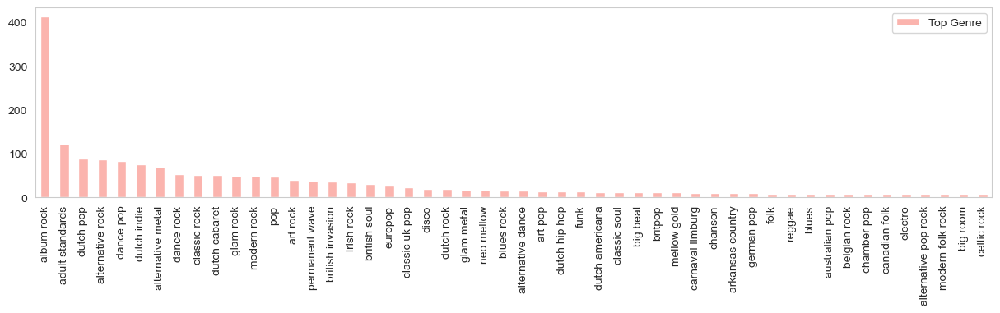

In [6]:
pd.DataFrame(data['Top Genre'].value_counts()).head(50).plot(kind = 'bar', figsize = (15, 3), cmap = 'Pastel1')

plt.grid(False);

It looks like there plenty types of rock and pop, lets try to group'em together and analyse.

In [7]:
def Grouping(genre):
    if 'rock' in genre.lower():
        
        return 'Rock'
    
    elif 'pop' in genre.lower():
        
        return 'Pop'
    
    return genre

data['Genre (Grouped)'] = data['Top Genre'].apply(Grouping)

In [8]:
data['Top Genre'].nunique() - data['Genre (Grouped)'].nunique()

64

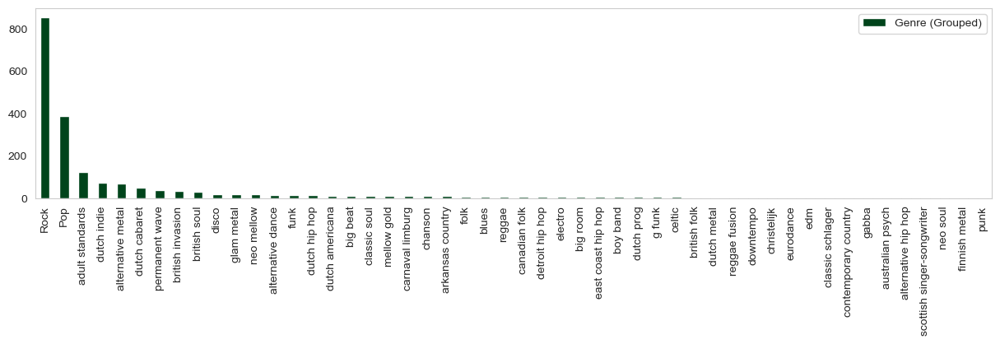

In [9]:
pd.DataFrame(data['Genre (Grouped)'].value_counts()).head(50).plot(kind = 'bar', 
                                                                   figsize = (15, 3), cmap = 'Greens_r')
plt.grid(False);

More than 50% of the dataset are types of Pop and Rock, so I know there gonna be at least 3 clusters.

## Artist

In [10]:
data['Artist'].nunique()

731

In [11]:
pd.DataFrame(data.groupby('Genre (Grouped)').count()['Artist'].sort_values(ascending = False)).head()

,Artist
Genre (Grouped),
Rock,857
Pop,388
adult standards,123
dutch indie,75
alternative metal,70


Adult standards is also very common in the genres. Lets see what are the top artist.

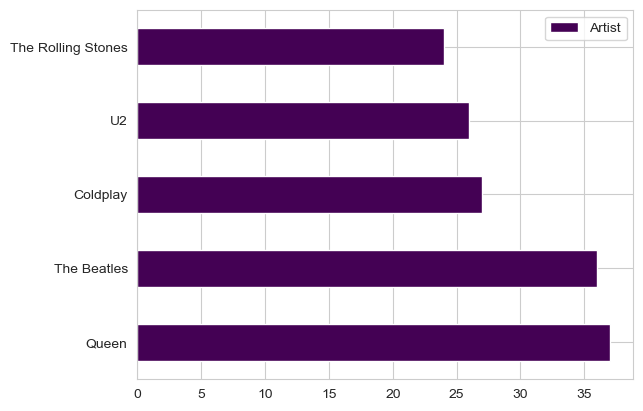

In [12]:
pd.DataFrame(data['Artist'].value_counts()).head(5).plot(kind = 'barh', cmap = 'viridis');

Very recognizable bands in the top, which is more than expected.

## Year

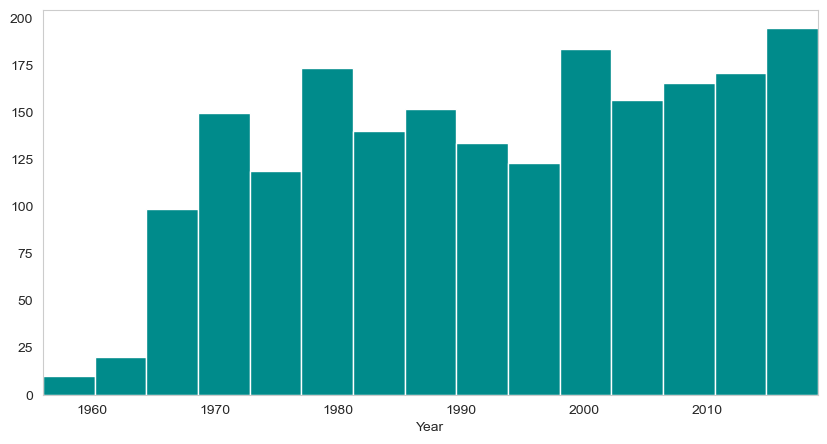

In [13]:
plt.figure(figsize = (10, 5))
sns.distplot(data['Year'], kde = False, 
             hist_kws = {'alpha' : 1}, color = 'darkcyan')

plt.grid(False)
plt.xlim(data['Year'].min(), data['Year'].max());

In [14]:
pd.DataFrame(data['Year'].value_counts().head())

,Year
2008,54
1991,52
2018,52
1977,51
2002,47


In [15]:
pd.DataFrame(data.groupby('Year').agg(pd.Series.mode)['Genre (Grouped)']).T

Year,1956,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Genre (Grouped),adult standards,adult standards,"[Rock, adult standards, bebop]",adult standards,adult standards,adult standards,"[Rock, adult standards, british invasion]",Rock,Rock,Rock,Rock,"[Rock, adult standards]",Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Rock,Pop,Pop,Rock,"[Pop, Rock]",Rock,Rock,Rock,Pop,Pop,Pop,Pop,Pop,Pop,Rock,Rock,Pop,Pop,Pop


It looks like Rock started to raise in the 1964 and it dominated until the appearance of Pop in 2002. Then Pop dominated since 2002 until 2019.

## Numerical Data

lets plot a correlation chart.

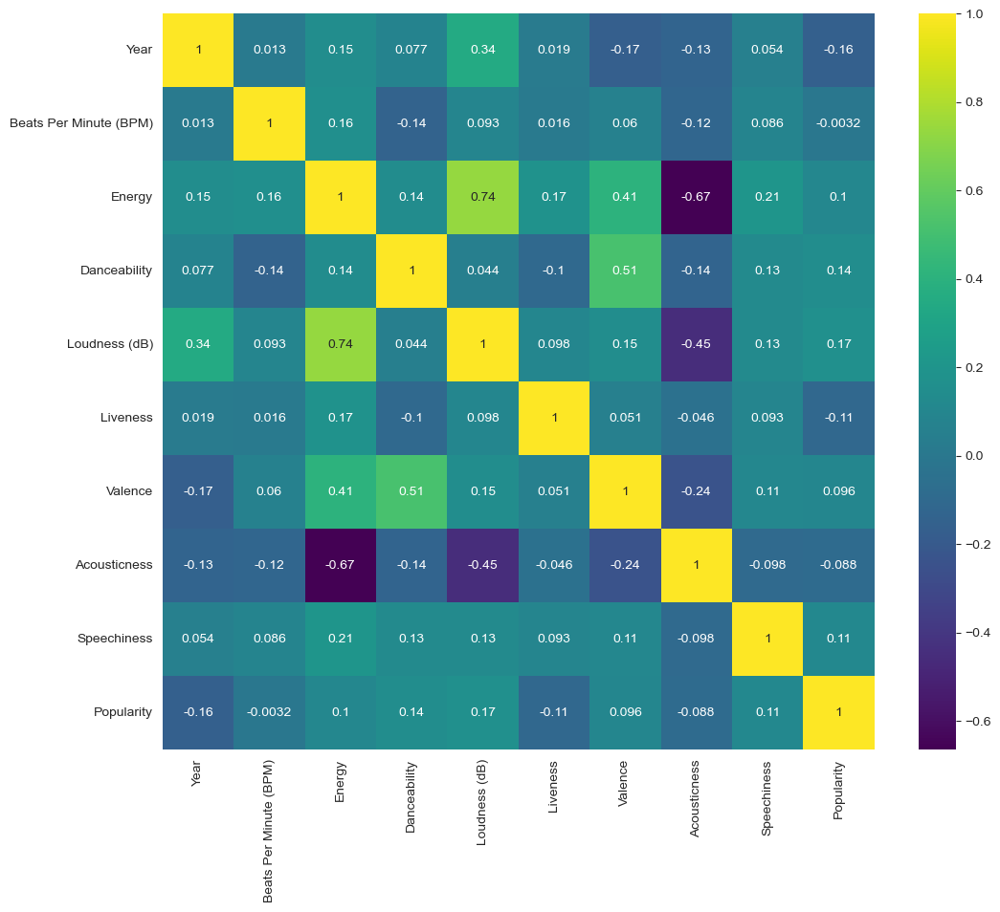

In [16]:
plt.figure(figsize = (12, 10))
sns.heatmap(data.select_dtypes(include = 'int64').corr(), cmap = 'viridis', annot = True);

There is some correlations in the data, some of the noticeables are:
- Loudnesss (dB) & Energy
- Valence & Energy
- Valence & Danceability
- Loudnesss (dB) & Year

Before we analyse this correlations, I would like to explore a pairplot.

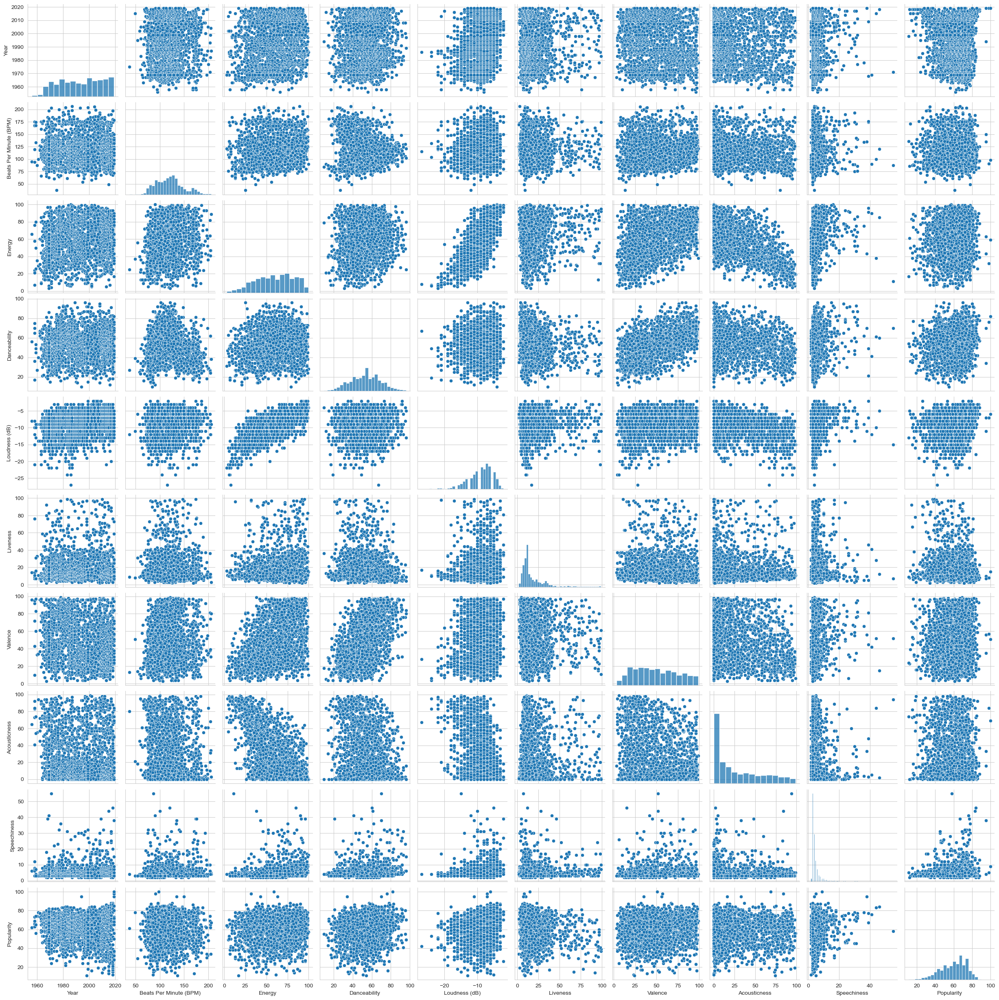

In [17]:
sns.pairplot(data.select_dtypes(include = 'int64'));

I would like to explore each feature independently and take a look at their statistics. For now lets take a look at the correlations mentioned before.

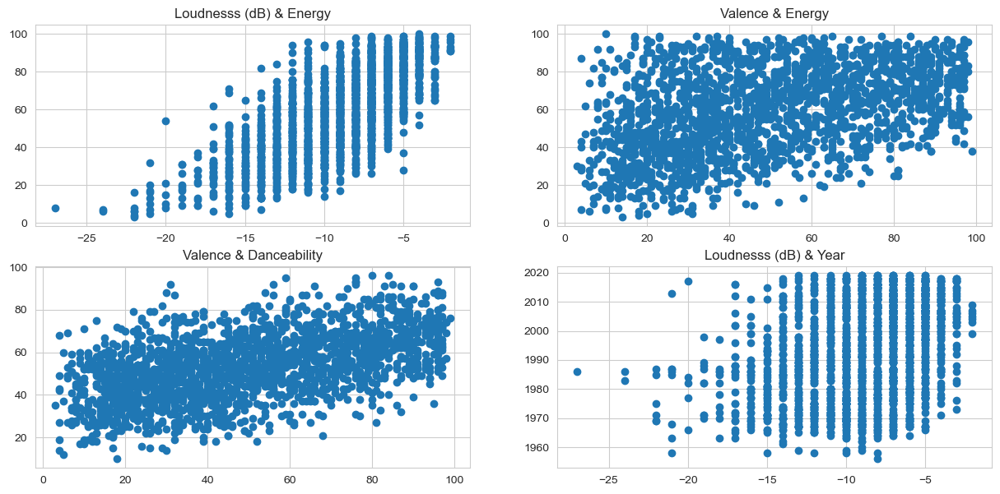

In [18]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (15, 7))

ax1.scatter(data['Loudness (dB)'], data['Energy'])
ax1.set_title('Loudnesss (dB) & Energy')

ax2.scatter(data['Valence'], data['Energy'])
ax2.set_title('Valence & Energy')

ax3.scatter(data['Valence'], data['Danceability'])
ax3.set_title('Valence & Danceability')

ax4.scatter(data['Loudness (dB)'], data['Year'])
ax4.set_title('Loudnesss (dB) & Year');

Loudnesss (dB) & Energy have a perfect linear relationship, Valence & Danceability also have a linear relationship but a bit messy. I would like to explore this further.

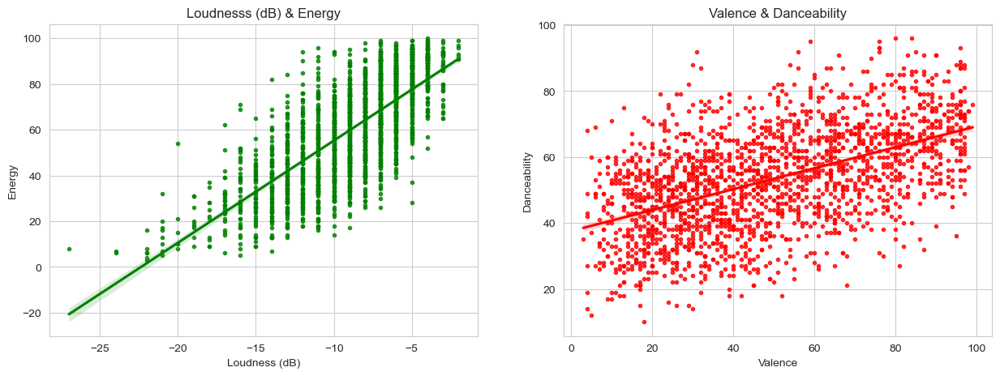

In [19]:
fig, (ax1, ax2) = plt.subplots(sharey = False, ncols = 2, nrows = 1, figsize = (15, 5))

sns.regplot(data = data, x = 'Loudness (dB)', y = 'Energy', ax = ax1, color = 'green', marker = '.')
ax1.set_title('Loudnesss (dB) & Energy')

sns.regplot(data = data, x = 'Valence', y = 'Danceability', ax = ax2, color = 'red', marker = '.')
ax2.set_title('Valence & Danceability');

Lets explore the numerical data individually.

### Beats Per Minute (BPM)

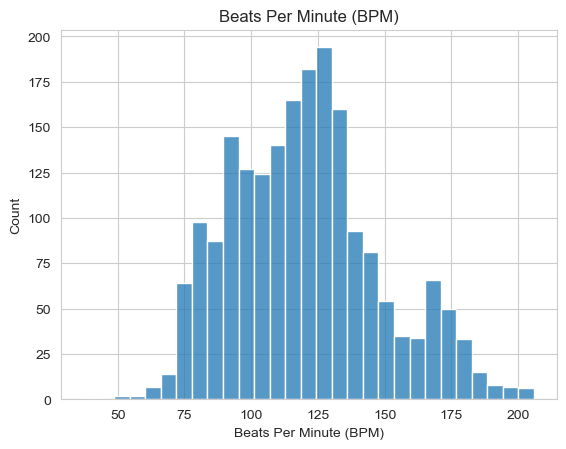

In [20]:
sns.histplot(data['Beats Per Minute (BPM)'])
plt.title('Beats Per Minute (BPM)');

Beats Per Minute (BPM) is normally distributed which is good and it looks like most of the samples are around 80 to 150, lets look at the correlation with the other variables.

In [21]:
data.select_dtypes(include = 'int64').corr()['Beats Per Minute (BPM)'].sort_values(ascending = False)[1:]

Energy           0.156644
Loudness (dB)    0.092927
Speechiness      0.085598
Valence          0.059653
Liveness         0.016256
Year             0.012570
Popularity      -0.003181
Acousticness    -0.122472
Danceability    -0.140602
Name: Beats Per Minute (BPM), dtype: float64

It has some decent correlation with energy, lets see it in a plot

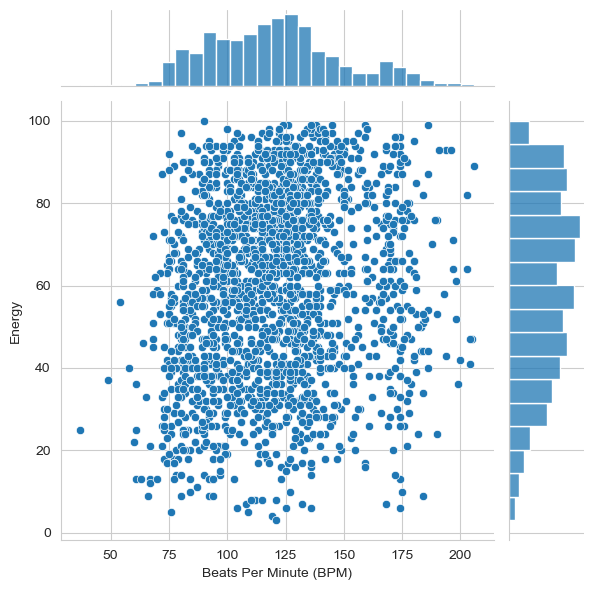

In [22]:
sns.jointplot(data = data, x = 'Beats Per Minute (BPM)', y = 'Energy');

Nothing really noticeable, outside some outliers.

### Energy

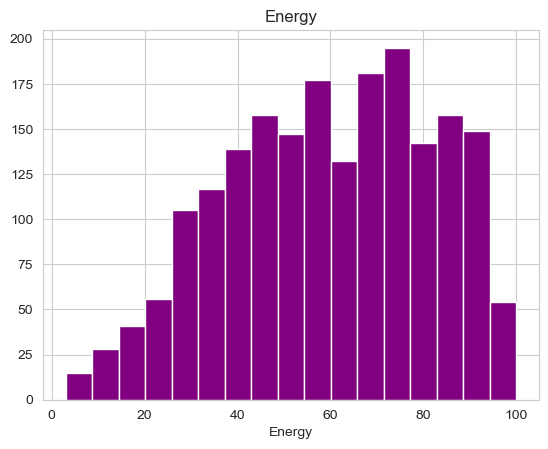

In [23]:
sns.distplot(data['Energy'], kde = False, hist_kws = {'alpha' : 1}, color = 'purple')
plt.title('Energy');

In [24]:
data.select_dtypes(include = 'int64').corr()['Energy'].sort_values(ascending = False)[1:]

Loudness (dB)             0.735711
Valence                   0.405175
Speechiness               0.205865
Liveness                  0.174118
Beats Per Minute (BPM)    0.156644
Year                      0.147235
Danceability              0.139616
Popularity                0.103393
Acousticness             -0.665156
Name: Energy, dtype: float64

as we explore it before, Energy correlates pretty well with Loudness and Valance.

### Loudness (dB)

In [25]:
data['Loudness (dB)'].nunique()

23

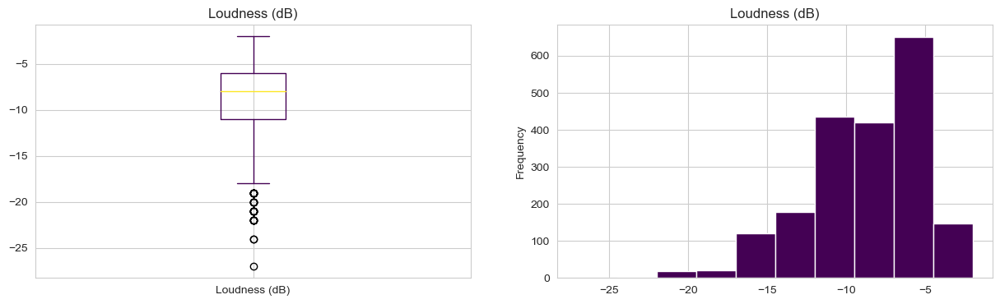

In [26]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, nrows = 1, figsize = (15, 4))

data['Loudness (dB)'].plot(kind = 'box', cmap = 'viridis', ax = ax1)
ax1.set_title('Loudness (dB)')

data['Loudness (dB)'].plot(kind = 'hist', cmap = 'viridis', ax = ax2)
ax2.set_title('Loudness (dB)');

In [27]:
data.select_dtypes(include = 'int64').corr()['Loudness (dB)'].sort_values(ascending = False)[1:]

Energy                    0.735711
Year                      0.343764
Popularity                0.165527
Valence                   0.147041
Speechiness               0.125090
Liveness                  0.098257
Beats Per Minute (BPM)    0.092927
Danceability              0.044235
Acousticness             -0.451635
Name: Loudness (dB), dtype: float64

### Danceability, Liveness and Valence

In [28]:
'''
If you are reading this in GitHub please download the notebook and run it locally, 
since GitHub does not support plotly interactive output you will see a blank output.
'''

fig = px.scatter_3d(data, x = 'Danceability', y = 'Liveness', z = 'Valence', 
                    color = 'Year', width = 800, height = 600)
fig.show()

High Valence is more present in older songs... This might be because now days we have more top hits like "Sad songs" playlist and trends going towards that. 

### Acousticness, Speechiness and Popularity

In [29]:
fig = px.scatter_3d(data, z = 'Acousticness', y = 'Speechiness', x = 'Popularity', 
                    color = 'Year', width = 800, height = 600)
fig.show()

We can see more older songs closer to 100 in popularity, lets look at the statistics.

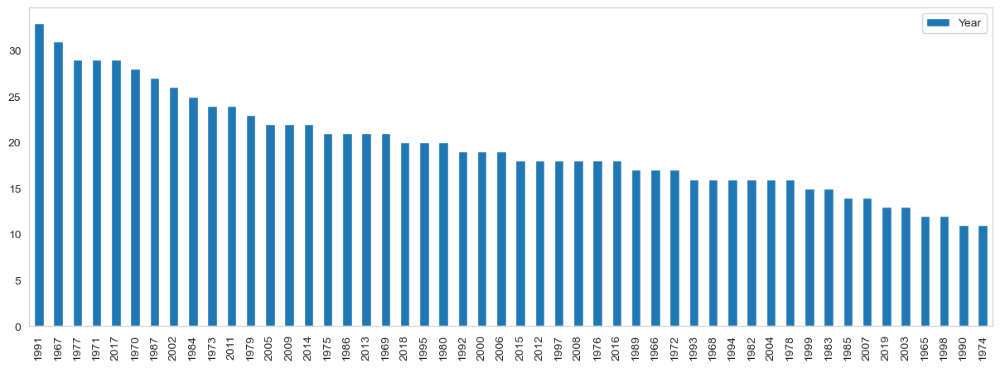

In [30]:
pd.DataFrame(data[data['Popularity'] > 60]['Year'].value_counts().head(50)).plot(kind = 'bar', figsize = (15, 5))
plt.grid(False);

We can see that those songs that have higher popularity than 60 are mostly for 1991 and 1967. 

### Summary

After the EAD I have explored enought to really said that I can understand the data and what relationships it has. With this section concluded I can start thinking of how to solve the problem.

# Model, predict and solve the problem.

Since we are working on a problem without label, I need to implement an unsupervised learning model, for a clustering there is a decent amount of algorithms that we can try. I would like to implement:

- K-Means Clustering
- Mean-Shift Clustering
- Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
- Agglomerative Hierarchical Clustering

Before we even try to train those algorithms, it is escential to know how many clusters are in the data. There are many methods to find this out, but the most stable one is the Elbow method.

First lets import the algorithms and create a dataframe with all the audio characteristics.

In [31]:
from sklearn.cluster import KMeans, MeanShift, DBSCAN, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler # Import an scaler
from tqdm.notebook import tqdm

In [32]:
MusicCharacteristics = data[['Beats Per Minute (BPM)', 'Energy', 'Danceability', 'Loudness (dB)',
      'Liveness', 'Valence', 'Length (Duration)', 'Acousticness' , 'Speechiness']]

It looks like Lenght (Duration) has some string values, lets find out what values are and convert them into floats

In [33]:
for item in MusicCharacteristics['Length (Duration)']:
    
    if ',' in item:
        
        print(item)

1,412
1,121
1,367
1,292


In [34]:
MusicCharacteristics['Length (Duration)'] = MusicCharacteristics['Length (Duration)'].apply(lambda value: float(value.replace(',', '.')) if ',' in value else float(value))

In [35]:
MusicCharacteristics[MusicCharacteristics['Length (Duration)'] < 2]

,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness
Index,,,,,,,,,
843,134,32,28,-17,11,14,1.412,37,4
905,81,60,22,-11,41,25,1.121,27,6
952,82,50,33,-16,13,11,1.367,11,4
1983,127,87,41,-6,83,65,1.292,0,4


## Elbow Method

In [36]:
KMeansScores = list() 

for clusters in tqdm(range(1, 31), total = 30):
    
    Scaler = MinMaxScaler()
    
    XScaled = Scaler.fit_transform(MusicCharacteristics)
        
    print(f"Clusters finished: {clusters}")
    
    KMeansModel = KMeans(n_clusters = clusters)
    KMeansModel.fit(XScaled)
    KMeansScores.append(KMeansModel.inertia_)

  0%|          | 0/30 [00:00<?, ?it/s]

Clusters finished: 1
Clusters finished: 2
Clusters finished: 3
Clusters finished: 4
Clusters finished: 5
Clusters finished: 6
Clusters finished: 7
Clusters finished: 8
Clusters finished: 9
Clusters finished: 10
Clusters finished: 11
Clusters finished: 12
Clusters finished: 13
Clusters finished: 14
Clusters finished: 15
Clusters finished: 16
Clusters finished: 17
Clusters finished: 18
Clusters finished: 19
Clusters finished: 20
Clusters finished: 21
Clusters finished: 22
Clusters finished: 23
Clusters finished: 24
Clusters finished: 25
Clusters finished: 26
Clusters finished: 27
Clusters finished: 28
Clusters finished: 29
Clusters finished: 30


Now lets plot the different scores.

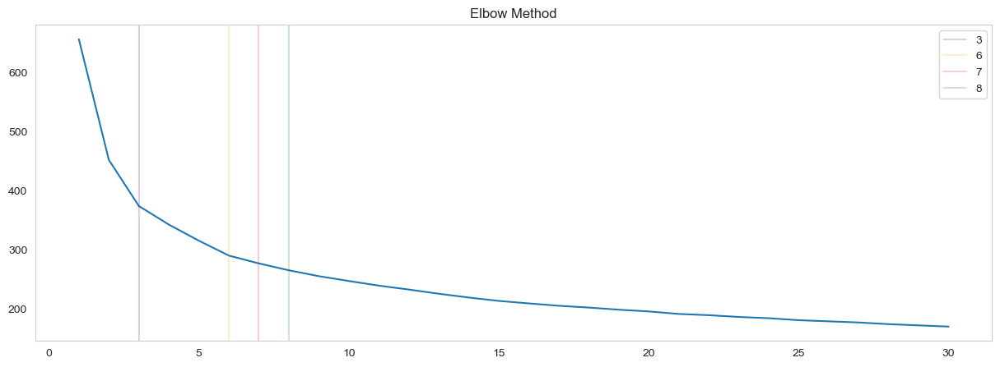

In [37]:
plt.figure(figsize = (15, 5))
sns.lineplot(x = list(range(1, 31)), y = KMeansScores)
plt.title('Elbow Method')
plt.axvline(3, color = 'purple', alpha = 0.2, label = '3')
plt.axvline(6, color = 'orange', alpha = 0.2, label = '6')
plt.axvline(7, color = 'red', alpha = 0.2, label = '7')
plt.axvline(8, color = 'green', alpha = 0.2, label = '8')
plt.legend(loc = 'upper right')
plt.grid(False);

It looks like the scores starts to flatten out at around 6/7/8, but there is a hard cut at 3. I would like to explore 6 and 3 clusters.

## Training KMeans (3 Clusters)

In [38]:
# Scaling the data

Scaler = MinMaxScaler()
    
XScaled = Scaler.fit_transform(MusicCharacteristics)

# Fitting the model with 3 clusters

KMeansModel = KMeans(n_clusters = 3)
clusters = KMeansModel.fit_predict(XScaled)

In [39]:
ClusteringPlot = MusicCharacteristics.copy()

ClusteringPlot['Clusters3'] = clusters

Lets plot the 3 clusters

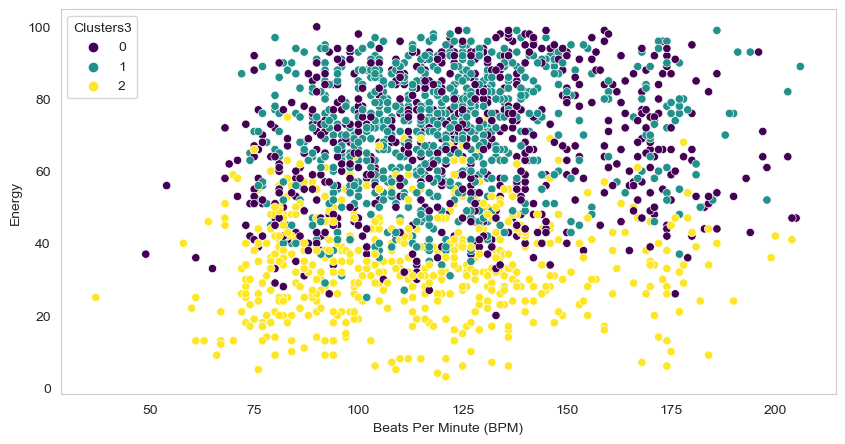

In [40]:
plt.figure(figsize = (10, 5))
sns.scatterplot(data = ClusteringPlot, x = 'Beats Per Minute (BPM)', y = 'Energy', hue = 'Clusters3', palette = 'viridis')
plt.grid(False);

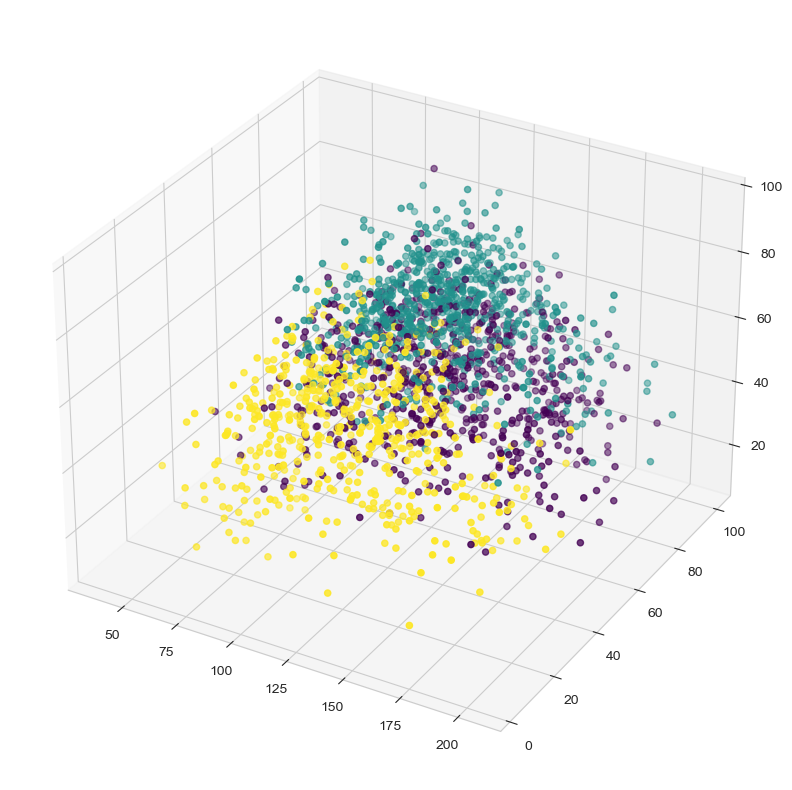

In [41]:
plt.figure(figsize = (10, 10))
axes = plt.axes(projection = '3d')
axes.scatter3D(ClusteringPlot['Beats Per Minute (BPM)'],
              ClusteringPlot['Energy'],
              ClusteringPlot['Danceability'], c = ClusteringPlot['Clusters3'], cmap = 'viridis');

In [42]:
fig = go.Figure()
for cluster in list(ClusteringPlot["Clusters3"].unique()):
    

    fig.add_trace(go.Scatter3d(x = ClusteringPlot[ClusteringPlot["Clusters3"]== cluster]['Beats Per Minute (BPM)'],
                                y = ClusteringPlot[ClusteringPlot["Clusters3"] == cluster]['Energy'],
                                z = ClusteringPlot[ClusteringPlot["Clusters3"] == cluster]['Danceability'],                        
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(cluster)))
    
fig.update_traces(hovertemplate='Beats Per Minute (BPM): %{x} <br>Energy: %{y} <br>Danceability: %{z}')

    
fig.update_layout(width = 1000, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Beats Per Minute (BPM)', titlefont_color = 'black'),
                                yaxis=dict(title = 'Energy', titlefont_color = 'black'),
                                zaxis=dict(title = 'Danceability', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

3 Cluster is a great starting point, but I still see some groups that can be clustered individually. I will try 6 or more and then compare.

## Training KMeans (6 Clusters)

In [43]:
# Scaling the data

Scaler = MinMaxScaler()
    
XScaled = Scaler.fit_transform(MusicCharacteristics)

# Fitting the model with 6 clusters

KMeansModel = KMeans(n_clusters = 6)
clusters = KMeansModel.fit_predict(XScaled)

In [44]:
ClusteringPlot['Clusters6'] = clusters

6 cluster visualization

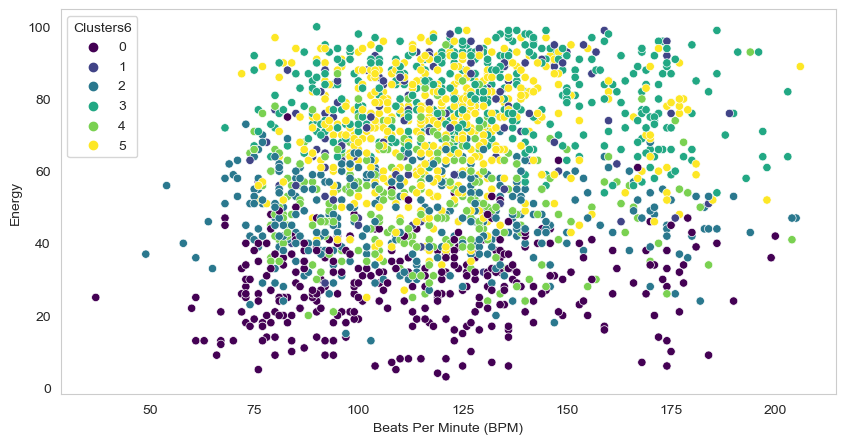

In [45]:
plt.figure(figsize = (10, 5))
sns.scatterplot(data = ClusteringPlot, x = 'Beats Per Minute (BPM)', y = 'Energy', hue = 'Clusters6', palette = 'viridis')
plt.grid(False);

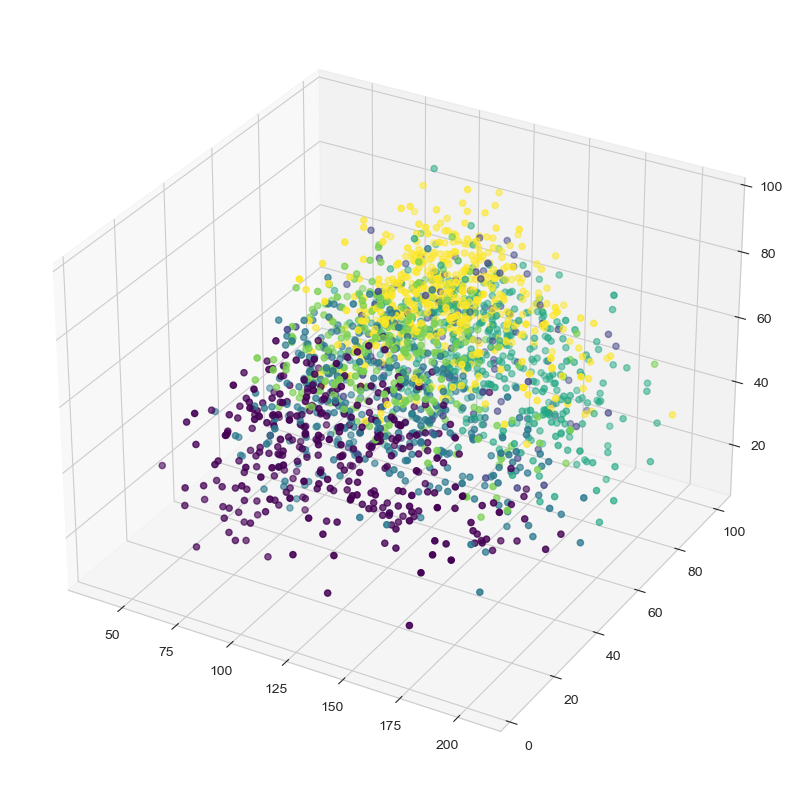

In [46]:
plt.figure(figsize = (10, 10))
axes = plt.axes(projection = '3d')
axes.scatter3D(ClusteringPlot['Beats Per Minute (BPM)'],
              ClusteringPlot['Energy'],
              ClusteringPlot['Danceability'], c = ClusteringPlot['Clusters6'], cmap = 'viridis');

In [47]:
fig = go.Figure()
for cluster in list(ClusteringPlot["Clusters6"].unique()):
    

    fig.add_trace(go.Scatter3d(x = ClusteringPlot[ClusteringPlot["Clusters6"]== cluster]['Beats Per Minute (BPM)'],
                                y = ClusteringPlot[ClusteringPlot["Clusters6"] == cluster]['Energy'],
                                z = ClusteringPlot[ClusteringPlot["Clusters6"] == cluster]['Danceability'],                        
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(cluster)))
    
fig.update_traces(hovertemplate='Beats Per Minute (BPM): %{x} <br>Energy: %{y} <br>Danceability: %{z}')

    
fig.update_layout(width = 1000, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Beats Per Minute (BPM)', titlefont_color = 'black'),
                                yaxis=dict(title = 'Energy', titlefont_color = 'black'),
                                zaxis=dict(title = 'Danceability', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

I still see some groups in low energy and high BPM that I would love to cluster individually. Lets try adding 2 or more clusters.

## Training KMeans (8 Clusters)

In [48]:
# Scaling the data

Scaler = MinMaxScaler()
    
XScaled = Scaler.fit_transform(MusicCharacteristics)

# Fitting the model with 8 clusters

KMeansModel = KMeans(n_clusters = 8)
clusters = KMeansModel.fit_predict(XScaled)

In [49]:
ClusteringPlot['Clusters8'] = clusters

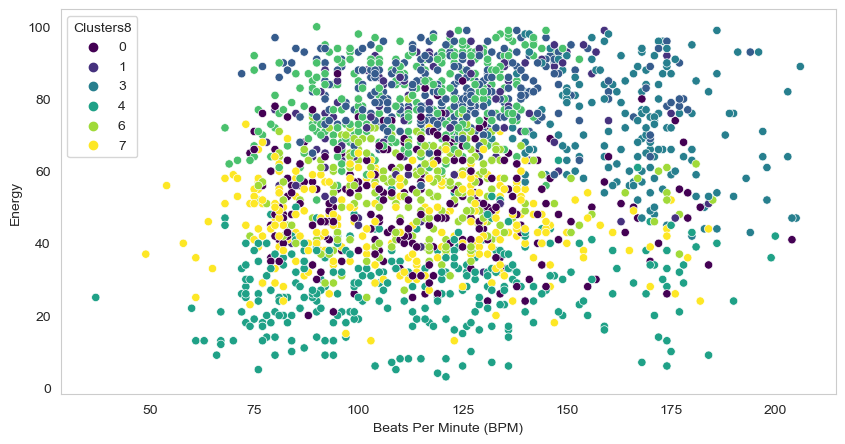

In [50]:
plt.figure(figsize = (10, 5))
sns.scatterplot(data = ClusteringPlot, x = 'Beats Per Minute (BPM)', y = 'Energy', hue = 'Clusters8', palette = 'viridis')
plt.grid(False);

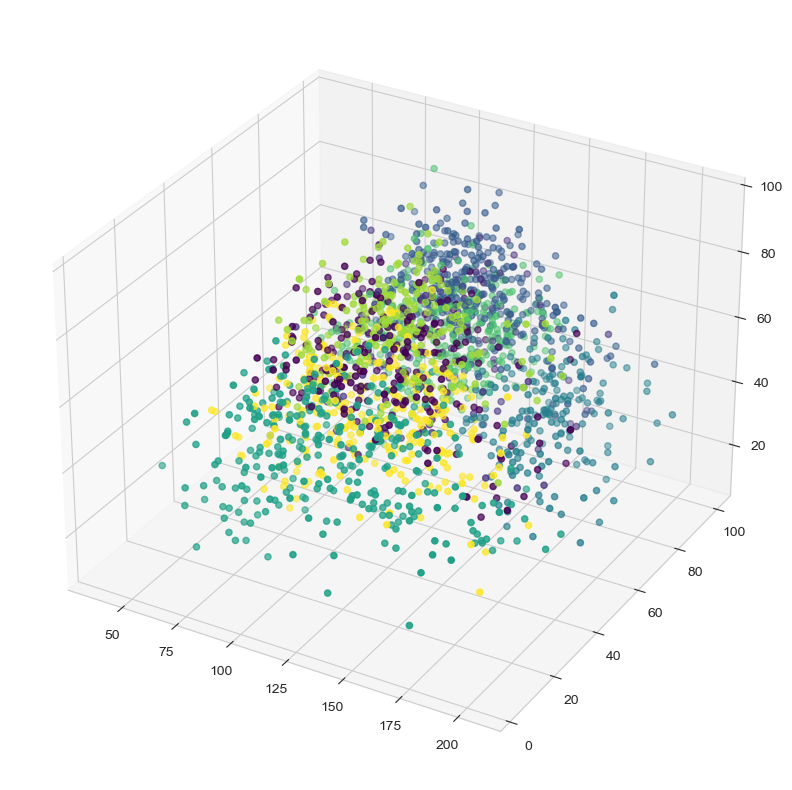

In [51]:
plt.figure(figsize = (10, 10))
axes = plt.axes(projection = '3d')
axes.scatter3D(ClusteringPlot['Beats Per Minute (BPM)'],
              ClusteringPlot['Energy'],
              ClusteringPlot['Danceability'], c = ClusteringPlot['Clusters8'], cmap = 'viridis');

In [52]:
fig = go.Figure()
for cluster in list(ClusteringPlot["Clusters8"].unique()):
    

    fig.add_trace(go.Scatter3d(x = ClusteringPlot[ClusteringPlot["Clusters8"]== cluster]['Beats Per Minute (BPM)'],
                                y = ClusteringPlot[ClusteringPlot["Clusters8"] == cluster]['Energy'],
                                z = ClusteringPlot[ClusteringPlot["Clusters8"] == cluster]['Danceability'],                        
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(cluster)))
    
fig.update_traces(hovertemplate='Beats Per Minute (BPM): %{x} <br>Energy: %{y} <br>Danceability: %{z}')

    
fig.update_layout(width = 1000, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Beats Per Minute (BPM)', titlefont_color = 'black'),
                                yaxis=dict(title = 'Energy', titlefont_color = 'black'),
                                zaxis=dict(title = 'Danceability', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

## Training KMeans (10 Clusters)

In [53]:
# Scaling the data

Scaler = MinMaxScaler()
    
XScaled = Scaler.fit_transform(MusicCharacteristics)

# Fitting the model with 8 clusters

KMeansModel = KMeans(n_clusters = 10)
clusters = KMeansModel.fit_predict(XScaled)

In [54]:
ClusteringPlot['Clusters10'] = clusters

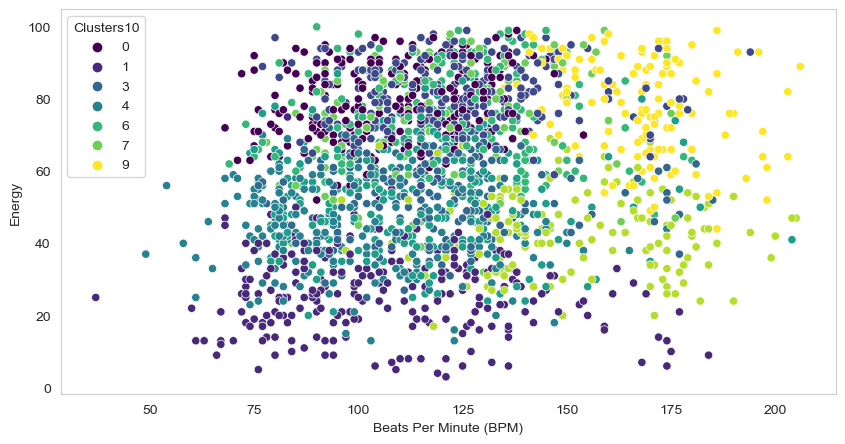

In [55]:
plt.figure(figsize = (10, 5))
sns.scatterplot(data = ClusteringPlot, x = 'Beats Per Minute (BPM)', y = 'Energy', hue = 'Clusters10', palette = 'viridis')
plt.grid(False);

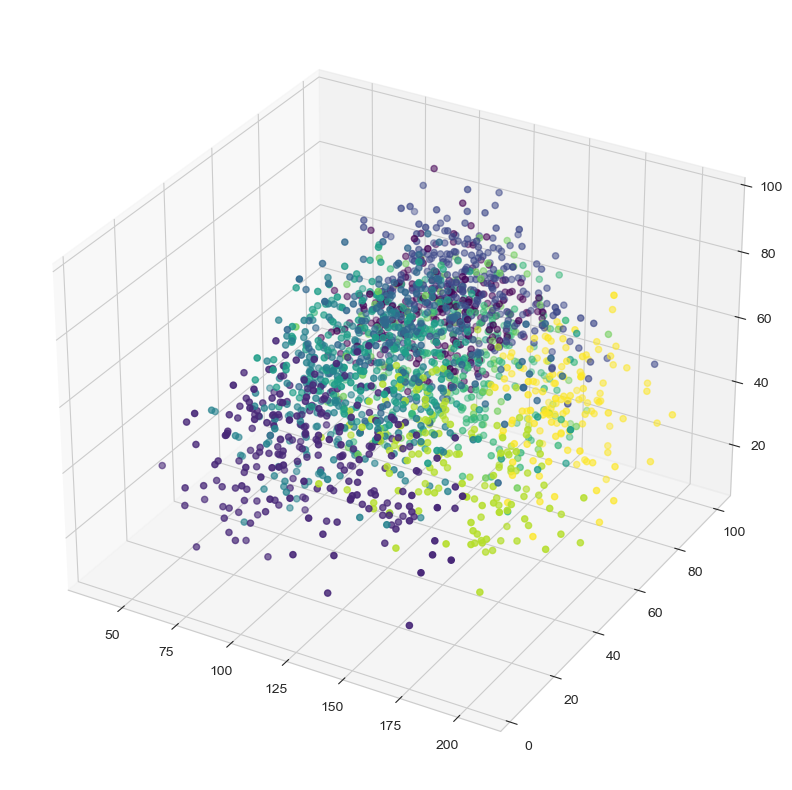

In [56]:
plt.figure(figsize = (10, 10))
axes = plt.axes(projection = '3d')
axes.scatter3D(ClusteringPlot['Beats Per Minute (BPM)'],
              ClusteringPlot['Energy'],
              ClusteringPlot['Danceability'], c = ClusteringPlot['Clusters10'], cmap = 'viridis');

In [57]:
fig = go.Figure()
for cluster in list(ClusteringPlot["Clusters10"].unique()):
    

    fig.add_trace(go.Scatter3d(x = ClusteringPlot[ClusteringPlot["Clusters10"]== cluster]['Beats Per Minute (BPM)'],
                                y = ClusteringPlot[ClusteringPlot["Clusters10"] == cluster]['Energy'],
                                z = ClusteringPlot[ClusteringPlot["Clusters10"] == cluster]['Danceability'],                        
                                mode = 'markers', marker_size = 6, marker_line_width = 1,
                                name = str(cluster)))
    
fig.update_traces(hovertemplate='Beats Per Minute (BPM): %{x} <br>Energy: %{y} <br>Danceability: %{z}')

    
fig.update_layout(width = 1000, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Beats Per Minute (BPM)', titlefont_color = 'black'),
                                yaxis=dict(title = 'Energy', titlefont_color = 'black'),
                                zaxis=dict(title = 'Danceability', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

We have discovered that 10 clusters is spotted on! Since I got a satisfying result using K-Means I am not gonna train the other models.

# Visualize, report, and present the problem solving steps and final solution.
Lets train a final model with 10 clusters in order to present the solution.

In [58]:
# Scale the data

Scaler = MinMaxScaler()
    
XScaled = Scaler.fit_transform(MusicCharacteristics)

In [59]:
# Fitting the final model

KmeansFinal = KMeans(n_clusters = 10, init='k-means++',
    n_init = 10,
    max_iter = 300,
    tol = 0.0001,
    verbose = 1,
    random_state = 42,
    copy_x = True,
    algorithm = 'auto',)

clusters = KMeansModel.fit_predict(XScaled)

In [60]:
FinalSample = MusicCharacteristics.copy()

FinalSample['Clusters'] = clusters

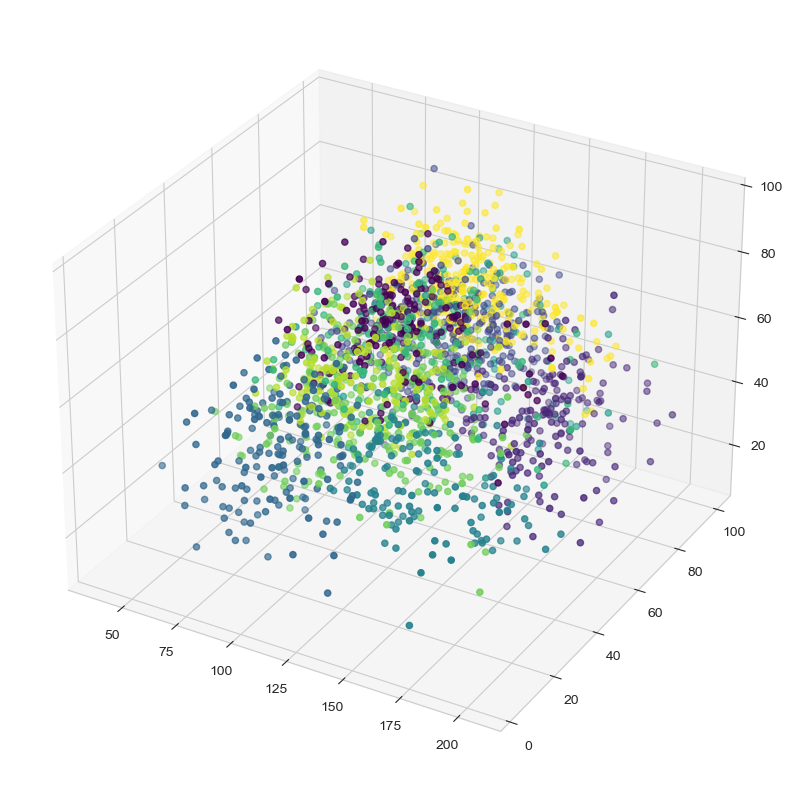

In [61]:
plt.figure(figsize = (10, 10))
axes = plt.axes(projection = '3d')
axes.scatter3D(FinalSample['Beats Per Minute (BPM)'],
              FinalSample['Energy'],
              FinalSample['Danceability'], c = FinalSample['Clusters'], cmap = 'viridis');

In [62]:
FinalSample.groupby('Clusters').mean().T[:-3]

Clusters,0,1,2,3,4,5,6,7,8,9
Beats Per Minute (BPM),116.024155,165.703488,113.641270,92.870588,148.673913,121.000000,118.493421,111.678715,107.328205,122.463918
Energy,54.565217,71.970930,79.765079,23.847059,33.195652,74.800000,57.815789,46.803213,48.748718,81.663230
Danceability,66.400966,38.720930,51.349206,44.894118,40.231884,52.047619,62.815789,45.156627,57.133333,65.274914
Loudness (dB),-11.473430,-6.883721,-6.111111,-13.982353,-11.601449,-7.523810,-9.611842,-10.196787,-9.174359,-6.604811
Liveness,13.048309,17.476744,17.171429,14.858824,16.768116,71.847619,18.039474,15.730924,15.107692,16.512027
Valence,72.458937,41.302326,40.193651,25.100000,30.768116,58.180952,77.276316,25.927711,38.758974,80.326460


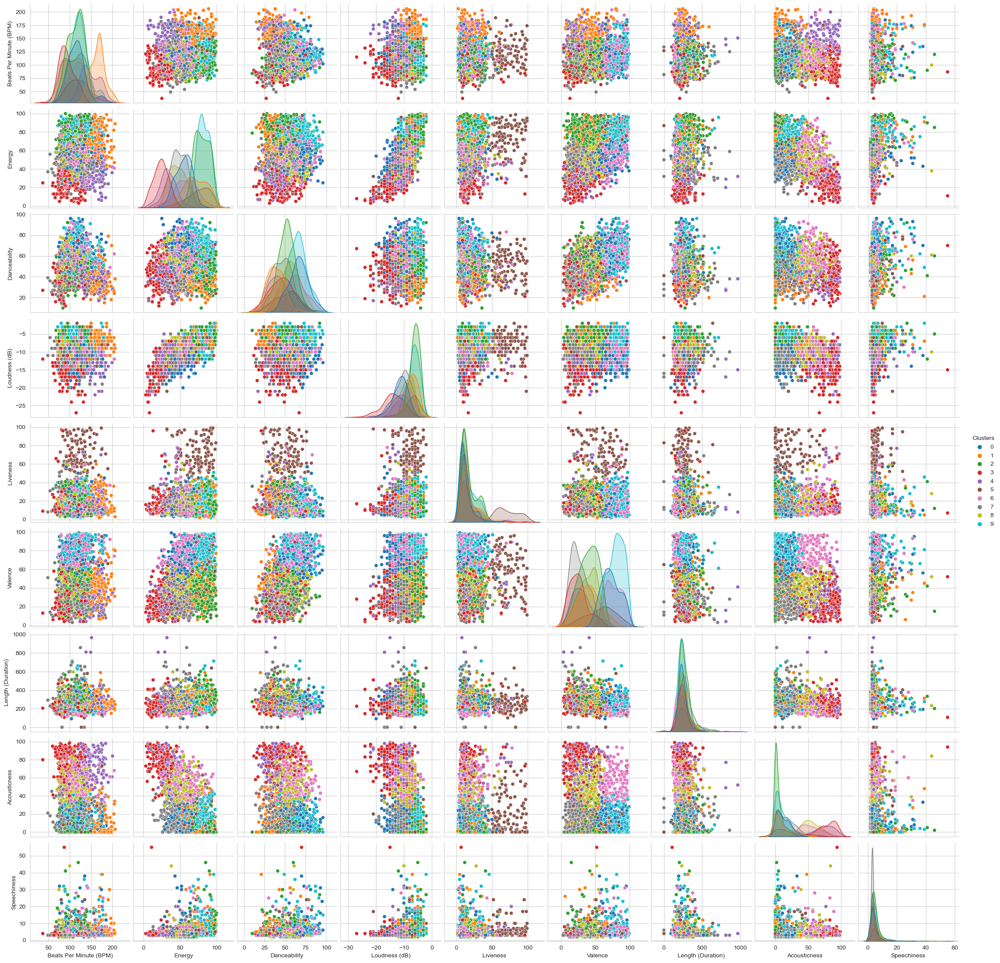

In [63]:
sns.pairplot(data = FinalSample, vars = ['Beats Per Minute (BPM)', 'Energy', 
                                                  'Danceability', 'Loudness (dB)',
      'Liveness', 'Valence', 'Length (Duration)', 'Acousticness' , 'Speechiness'], hue = 'Clusters', palette = 'tab10');

Lets look at the high correlation features with the clusters.

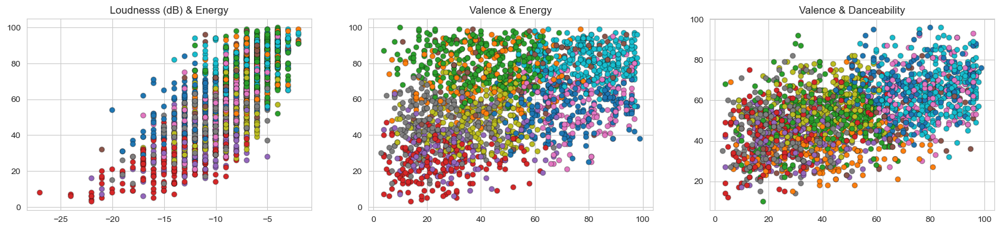

In [64]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize = (20, 4))

ax1.scatter(FinalSample['Loudness (dB)'], FinalSample['Energy'], c = FinalSample['Clusters'], cmap = 'tab10', edgecolors = (0,0,0,0.3))
ax1.set_title('Loudnesss (dB) & Energy')

ax2.scatter(FinalSample['Valence'], FinalSample['Energy'], c = FinalSample['Clusters'], cmap = 'tab10', edgecolors = (0,0,0,0.3))
ax2.set_title('Valence & Energy')

ax3.scatter(FinalSample['Valence'], FinalSample['Danceability'], c = FinalSample['Clusters'], cmap = 'tab10', edgecolors = (0,0,0,0.3))
ax3.set_title('Valence & Danceability');

Lets plot Loudness, Energy and Valence.

In [65]:
fig = px.scatter_3d(FinalSample, z = 'Energy', y = 'Valence', x = 'Loudness (dB)', 
                    color = 'Clusters', width = 800, height = 600)
fig.show()

Unfortunely we cannot plot the 9 features together in order to see the complete plots, but from the statistics we saw that it differentiate very good.

## Summary

With this project we introduced a way to identify what kind of music does a person likes by analysing their current liked songs and not only by knowing about their lifestyle, hobbies, or profession. So it will be easy for the music streaming API to recommend music to a person, implementing a recomendation system trained together with the clusters for those users looking to taste new music similar to the ones they liked. 

It is an efficient way of solving a little part of a bigger problem which is the recomendation system, good services are build step by step and clustering is a good starting poing for the company. I am satisfied with the results and I know they will be useful and easily implement in future systems.

# Supply or submit the results.

Saving clusterings and trained model.

In [66]:
# Clusters

FinalSample.to_csv('Clusters/ClusteredData.csv', index = 'Index')

In [67]:
# Saving Model

import pickle

pickle.dump(KmeansFinal, open('Model/KMeansTrained', 'wb'))


Load the model 

model = pickle.load(open(model_file_path, 'rb'))